In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import healpy as hp
import lsst.sims.maf.db as db


In [4]:
plt.rc('legend', fontsize=20) # using a size in points
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=16)
plt.rcParams['axes.labelsize'] = 16

In [13]:
# load opsim database
dbpath_v1_5 = "/home/idies/workspace/lsst_cadence/FBS_1.5/"  # path to all opsim databases
dbpath_v1_7 = "/home/idies/workspace/lsst_cadence/FBS_1.7/"  # path to all opsim databases
dbpath_v1_7_1 = "/home/idies/workspace/lsst_cadence/FBS_1.7.1/"  # path to all opsim databases


# output directory
outDir = '/home/idies/workspace/Temporary/lixl/scratch/outDir'
#resultsDb = db.ResultsDb(outDir=outDir)


In [14]:
# get the name of all opsim dbs 
import glob

# get the name of all opsim dbs
workpath = os.getcwd()
os.chdir(dbpath_v1_5)  # change to opsim database directory
dblist_all_v1_5 = glob.glob('*.db') 
dblist_all_v1_5.sort()

os.chdir(dbpath_v1_7)  # change to opsim database directory
dblist_all_v1_7 = glob.glob('*.db') 
dblist_all_v1_7.sort()

os.chdir(dbpath_v1_7_1)  # change to opsim database directory
dblist_all_v1_7_1 = glob.glob('*.db') 
dblist_all_v1_7_1.sort()

os.chdir(workpath) # change back to work directory



In [18]:
# check proposal information
propdic = {}
for i, dbname in enumerate( dblist_all ):
    #dbname=dblist_all[4]
    #dbname="pair_strategy_0_v1.5_10yrs.db"
    #dbname = "sat_dodge_v1.4_10yrs.db"
    opsdb = db.OpsimDatabase(dbpath+dbname)
    
    propInfo = opsdb.fetchPropInfo()[0]
    print(i, dbname)
    propdic[dbname] = propInfo
prop_df = pd.DataFrame(propdic).T


0 agnddf_v1.5_10yrs.db
1 alt_dust_v1.5_10yrs.db
2 alt_roll_mod2_dust_sdf_0.20_v1.5_10yrs.db
3 baseline_2snaps_v1.5_10yrs.db
4 baseline_v1.5_10yrs.db
5 bulges_bs_v1.5_10yrs.db
6 bulges_bulge_wfd_v1.5_10yrs.db
7 bulges_cadence_bs_v1.5_10yrs.db
8 bulges_cadence_bulge_wfd_v1.5_10yrs.db
9 bulges_cadence_i_heavy_v1.5_10yrs.db
10 bulges_i_heavy_v1.5_10yrs.db
11 daily_ddf_v1.5_10yrs.db
12 dcr_nham1_ug_v1.5_10yrs.db
13 dcr_nham1_ugr_v1.5_10yrs.db
14 dcr_nham1_ugri_v1.5_10yrs.db
15 dcr_nham2_ug_v1.5_10yrs.db
16 dcr_nham2_ugr_v1.5_10yrs.db
17 dcr_nham2_ugri_v1.5_10yrs.db
18 descddf_v1.5_10yrs.db
19 filterdist_indx1_v1.5_10yrs.db
20 filterdist_indx2_v1.5_10yrs.db
21 filterdist_indx3_v1.5_10yrs.db
22 filterdist_indx4_v1.5_10yrs.db
23 filterdist_indx5_v1.5_10yrs.db
24 filterdist_indx6_v1.5_10yrs.db
25 filterdist_indx7_v1.5_10yrs.db
26 filterdist_indx8_v1.5_10yrs.db
27 footprint_add_mag_cloudsv1.5_10yrs.db
28 footprint_big_sky_dustv1.5_10yrs.db
29 footprint_big_sky_nouiyv1.5_10yrs.db
30 footprint_big

In [ ]:
prop_df

In [8]:
#  get columns from databases
def get_cols(dbfile, cols='night', lim=None):
    """
    cols = 'night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note'
    connect to database
    Returns: a pandas DataFrame
    
    Examples:
    
    cols = 'night, observationStartMJD, fieldRA, filter, fieldDec, proposalId, note, '

    df = get_cols(dbfile=dbpath + db, cols=cols, lim='night<300')
   
    """
    import sqlite3
    import pandas as pd
    connection = sqlite3.connect(dbfile)
    cursor = connection.cursor()
    
    if lim!=None:
        sqlstr = "SELECT {} FROM SummaryAllProps where {}".format(cols, lim)
    else:
        sqlstr = "SELECT {} FROM SummaryAllProps".format(cols)

    print('connect to ', dbfile, '\n', sqlstr)
    cursor.execute(sqlstr)
    data = cursor.fetchall()
    
    # convert data to dataframe
    data_df = pd.DataFrame(data, columns=cols.split(', '))
    
    # close connection
    connection.close()
    
    return data_df

def get_pixId(df, nside=16):
    '''get pixId for each field'''
    pixId = RADec2pix(nside, ra=df['fieldRA'].values, dec=df['fieldDec'].values)
    df['pixId'] = pixId
    return df

def pix2radec(nside, ipix, degree=True):
    """from ipix to ra/dec"""
    
    theta, phi = hp.pix2ang(nside, ipix)
    ra = phi
    dec = np.pi/2. - theta
    if degree:
        ra = np.rad2deg(ra)
        dec = np.rad2deg(dec)
    return ra, dec

def RADec2pix(nside, ra, dec, degree=True):
    """
    Calculate the nearest healpixel ID of an RA/Dec array, assuming nside.

    Parameters
    ----------
    nside : int
        The nside value of the healpix grid.
    ra : numpy.ndarray
        The RA values to be converted to healpix ids, in degree by default.
    dec : numpy.ndarray
        The Dec values to be converted to healpix ids, in degree by default.

    Returns
    -------
    numpy.ndarray
        The healpix ids.
    """
    if degree:
        ra = np.radians(ra) # change to radians
        dec = np.radians(dec)
    
    lat = np.pi/2. - dec
    hpid = hp.ang2pix(nside, lat, ra )
    return hpid

def radec2xyz(ra, dec):
    '''convert ra/dec to xyz'''
    theta = 0.5 * np.pi - np.deg2rad(dec)
    phi = np.deg2rad(ra)
    xyz = hp.ang2vec(theta, phi)
    
    return xyz

def radec2gal(ra, dec):
    '''convert from ra/dec to galactic l/b'''
    from astropy.coordinates import SkyCoord
    from astropy import units as u
    c = SkyCoord(ra=ra, dec=dec, 
                 unit=(u.degree, u.degree))
    
    l = c.galactic.l.degree
    b = c.galactic.b.degree
    return l, b

def gal2radec(gl, gb):
    '''convert gl/gb to ra/dec'''
    from astropy.coordinates import SkyCoord
    from astropy import units as u
    c = SkyCoord(l=gl, b=gb, frame="galactic",
                unit=(u.degree, u.degree))
    ra = c.icrs.ra.degree
    dec = c.icrs.dec.degree
    return ra, dec


# plot function
# plot skymap

def plot_mwd(ax, RA, Dec, c, org=0, title='Mollweide projection', projection='mollweide', vmax=None, colorbar=True, **kwargs):
    ''' RA, Dec are arrays of the same length.
    RA takes values in [0,360), Dec in [-90,90],
    which represent angles in degrees.
    org is the origin of the plot, 0 or a multiple of 30 degrees in [0,360).
    title is the title of the figure.
    projection is the kind of projection: 'mollweide', 'aitoff', 'hammer', 'lambert'
    
    Examples:
    >>> fig, ax = plt.subplots(1, 1, figsize=(8, 8), 
                            subplot_kw={'projection': 'mollweide'}); 
        plot_mwd(ax, x, y, c, title='') 
        
    '''
    import numpy as np
    import matplotlib.pyplot as plt

    if vmax is None:
        vmax = c.max()
    
    x = np.remainder(RA+360-org,360) # shift RA values
    ind = x>180
    x[ind] -=360    # scale conversion to [-180, 180]
    x=-x    # reverse the scale: East to the left
    tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
    tick_labels = np.remainder(tick_labels+360+org,360)
    # fig = plt.figure(figsize=(10, 5))
    # ax = fig.add_subplot(111, projection=projection, facecolor ='LightCyan')
    # ax = fig.add_subplot(111, projection=projection, facecolor ='honeydew')
    sc = ax.scatter(np.radians(x), np.radians(Dec), c=c, marker='o', vmin=0, vmax=vmax, **kwargs)  # convert degrees to radians
    # ax.set_xticklabels(tick_labels)     # we add the scale on the x axis
    ax.set_title(title)
    ax.title.set_fontsize(15)
    ax.set_xlabel("RA")
    ax.xaxis.label.set_fontsize(12)
    ax.set_ylabel("Dec")
    ax.yaxis.label.set_fontsize(12)
    ax.grid(True)
    if colorbar:
        cbar = plt.colorbar(sc, ax=ax, orientation="horizontal")
    #cbar.set_clim(-2.0, 2.0)

def plot_filter_Nv(df, coord='C', figsize= (12, 6), colorbar=True, vmax=None, **kwargs):
    """plot number of visits in 6 filters"""
    
    fig, axs = plt.subplots(2, 3, figsize=figsize,
                            subplot_kw={'projection': 'mollweide'}); 
    axs = axs.ravel()
    FILTERS = ['u', 'g', 'r', 'i', 'z', 'y']
    for i, f in enumerate(FILTERS):
        
        df_f = df[ df['filter']==f ]
        if coord=='G':
            x = df_f['fieldGl'].values
            y = df_f['fieldGb'].values       
        else:
            x = df_f['fieldRA'].values
            y = df_f['fieldDec'].values
        c = df_f['Nv'].values
        if len(c)!=0:
            plot_mwd(axs[i], x, y, c, title=f, colorbar=colorbar, vmax=vmax, **kwargs)
        axs[i].set_xticklabels([])
        axs[i].set_yticklabels([])
        axs[i].set_title(f)



### plot 6 filters for one opsim

In [26]:
# baseline
dbname = 'baseline_v1.5_10yrs.db'

# get some data from opsim database
COLS = 'night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note'
lim = None
df_opsim = get_cols(dbfile=dbpath + dbname, cols=COLS, lim=lim)

# get healpix Ids
NSIDE = 16
df_opsim = get_pixId(df_opsim, nside=NSIDE)

# in galactic coordinates
df_opsim['fieldGl'], df_opsim['fieldGb'] = radec2gal(ra=df_opsim['fieldRA'].values, dec=df_opsim['fieldDec'].values)




connect to  /home/idies/workspace/lsst_cadence/FBS_1.5/baseline_v1.5_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps


In [28]:
df_opsim.head()

,night,observationStartMJD,fieldRA,fieldDec,filter,proposalId,note,pixId,fieldGl,fieldGb
0,1,59853.985644,294.696105,4.470982,z,0,greedy,1428,42.394220,-8.421518
1,1,59853.986058,297.734708,3.424593,z,1,greedy,1493,42.926090,-11.585333
2,1,59853.986472,300.801528,2.671025,z,1,greedy,1429,43.761239,-14.632481
3,1,59853.986884,298.330258,0.734934,z,1,greedy,1493,40.791975,-13.387359
4,1,59853.987297,295.864474,-1.054837,z,1,greedy,1556,37.989186,-12.042653


In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), 
                            subplot_kw={'projection': 'mollweide'}); 

plot_mwd(ax, x, y, c, title='') 



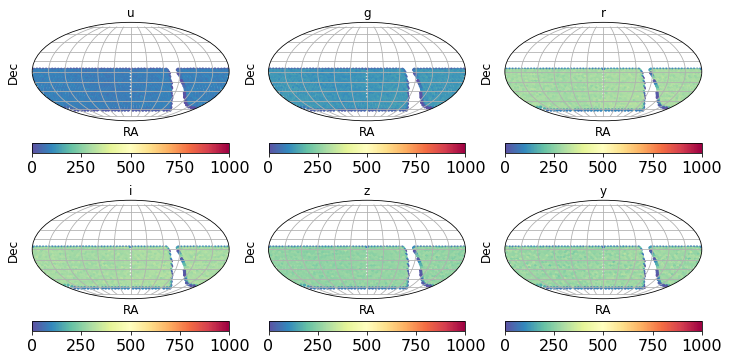

In [36]:
slicer = df_opsim['proposalId'] == 1 
df = df_opsim[slicer]
# groupby healpix
bydic = {
    "observationStartMJD": "count",
    "fieldRA" : "mean",
    "fieldDec": "mean",
    "fieldGl" : "min",
    "fieldGb": "min",
}
df = df.groupby(by=['pixId','filter'], as_index=False).agg(bydic).rename(columns={"observationStartMJD": "Nv"})

plot_filter_Nv(df, coord='C', figsize=(12, 6), vmax=1000, s=5, cmap=plt.cm.Spectral_r)



In [10]:
%%time
# plot footprint for all opsims

COLS = 'night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note'
lim = None
# get healpix Ids
NSIDE = 16

df_dic_v1_5 = {}
dblist_all = dblist_all_v1_5
for dbname in dblist_all:
    # get some data from opsim database

    df_opsim = get_cols(dbfile=dbpath_v1_5 + dbname, cols=COLS, lim=lim)
    df_opsim = get_pixId(df_opsim, nside=NSIDE)
    # in galactic coordinates
    df_opsim['fieldGl'], df_opsim['fieldGb'] = radec2gal(ra=df_opsim['fieldRA'].values, dec=df_opsim['fieldDec'].values)
    df_dic_v1_5[dbname] = df_opsim
    
df_dic_v1_7 = {}
dblist_all = dblist_all_v1_7
for dbname in dblist_all:
    # get some data from opsim database

    df_opsim = get_cols(dbfile=dbpath_v1_7 + dbname, cols=COLS, lim=lim)
    df_opsim = get_pixId(df_opsim, nside=NSIDE)
    # in galactic coordinates
    df_opsim['fieldGl'], df_opsim['fieldGb'] = radec2gal(ra=df_opsim['fieldRA'].values, dec=df_opsim['fieldDec'].values)
    df_dic_v1_7[dbname] = df_opsim


connect to  /home/idies/workspace/lsst_cadence/FBS_1.5/agnddf_v1.5_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.5/alt_dust_v1.5_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.5/alt_roll_mod2_dust_sdf_0.20_v1.5_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.5/baseline_2snaps_v1.5_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.5/baseline_samefilt_v1.5_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.5/baseline_v1.

In [16]:
df_dic_v1_7_1 = {}
dblist_all = dblist_all_v1_7_1
for dbname in dblist_all:
    # get some data from opsim database

    df_opsim = get_cols(dbfile=dbpath_v1_7_1 + dbname, cols=COLS, lim=lim)
    df_opsim = get_pixId(df_opsim, nside=NSIDE)
    # in galactic coordinates
    df_opsim['fieldGl'], df_opsim['fieldGb'] = radec2gal(ra=df_opsim['fieldRA'].values, dec=df_opsim['fieldDec'].values)
    df_dic_v1_7_1[dbname] = df_opsim

connect to  /home/idies/workspace/lsst_cadence/FBS_1.7.1/baseline_nexp2_v1.7.1_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.7.1/bulge_roll_scale0.90_nslice2_fpw0.9_nrw1.0v1.7_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.7.1/bulge_roll_scale0.90_nslice3_fpw0.9_nrw1.0v1.7_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.7.1/footprint_6_v1.7.1_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note FROM SummaryAllProps
connect to  /home/idies/workspace/lsst_cadence/FBS_1.7.1/full_disk_scale0.90_nslice2_fpw0.9_nrw1.0v1.7_10yrs.db 
 SELECT night, observationStartMJD, fieldRA, fieldDec, filter, proposalId, note 

In [10]:
df_opsim = df_dic[dblist_all[5]]

In [13]:
df_opsim[ df_opsim['note'].str.contains("DD") ]

,night,observationStartMJD,fieldRA,fieldDec,filter,proposalId,note,pixId,fieldGl,fieldGb
534,1,59854.210978,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
535,1,59854.211360,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
536,1,59854.211742,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
537,1,59854.212124,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
538,1,59854.212506,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
539,1,59854.212888,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
540,1,59854.213270,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
541,1,59854.213652,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
542,1,59854.214034,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291
543,1,59854.214416,10.323732,-44.116700,y,3,DD:ELAISS1,2593,309.129454,-72.889291


In [9]:
import pickle
pkfile = '/home/idies/workspace/Temporary/lixl/scratch/outDir/dataRaw_v1_5/dic_df_opsim.pkl'
with open( pkfile, 'wb' ) as f:
    pickle.dump(df_dic, f)

In [ ]:
# load from pickle file
#with open(filename, ‘rb’) as f:
#    var_you_want_to_load_into = pickle.load(f)

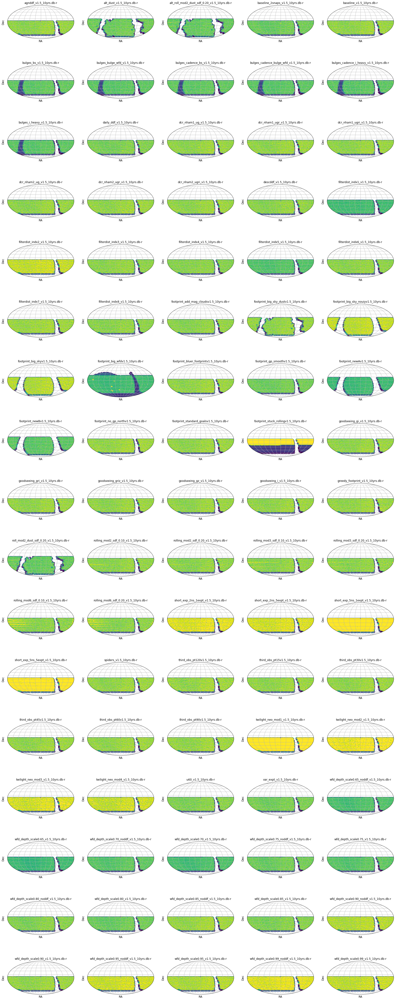

In [65]:

# groupby healpix
bydic = {
        "observationStartMJD": "count",
        "fieldRA" : "mean",
        "fieldDec": "mean",
        "fieldGl" : "min",
        "fieldGb": "min",
    }
f = 'r'
coord = 'C'

fig, axs = plt.subplots(17, 5, figsize=(30, 80),
                            subplot_kw={'projection': 'mollweide'}); 
axs = axs.flatten()

for i, dbname in enumerate( dblist_all ):  
    df_opsim = df_dic[dbname]
    if i==31:
        # for opsim without proposal info
        df = df_opsim
    else:
        slicer = df_opsim['proposalId'] == 1 
        df = df_opsim[slicer]

    df = df.groupby(by=['pixId','filter'], as_index=False).agg(bydic).rename(columns={"observationStartMJD": "Nv"})
    
    df_f = df[ df['filter']==f ]
    if coord=='G':
        x = df_f['fieldGl'].values
        y = df_f['fieldGb'].values       
    else:
        x = df_f['fieldRA'].values
        y = df_f['fieldDec'].values
    c = df_f['Nv'].values
    if len(c)!=0:
        plot_mwd(axs[i], x, y, c, title=f, colorbar=False, vmax=350,)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].set_title(dbname + '-' + f)


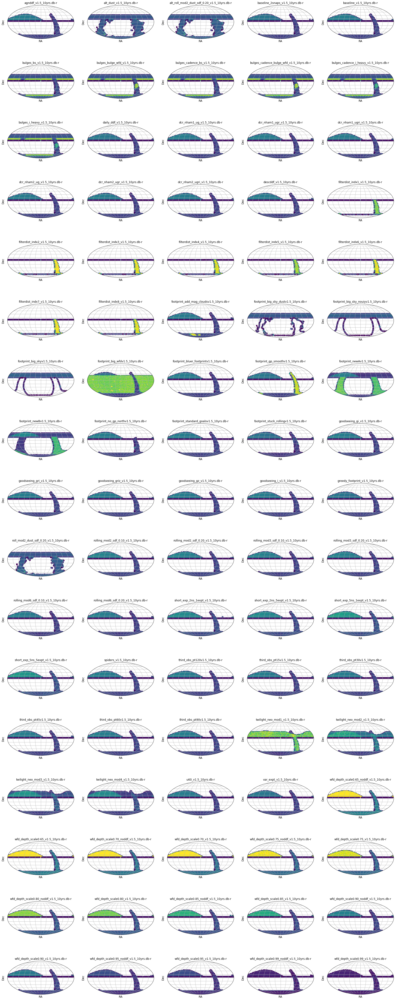

In [63]:

# groupby healpix
bydic = {
        "observationStartMJD": "count",
        "fieldRA" : "mean",
        "fieldDec": "mean",
        "fieldGl" : "min",
        "fieldGb": "min",
    }
f = 'r'
coord = 'C'

fig, axs = plt.subplots(17, 5, figsize=(30, 80),
                            subplot_kw={'projection': 'mollweide'}); 
axs = axs.flatten()

for i, dbname in enumerate( dblist_all ):  
    df_opsim = df_dic[dbname]
    if i==31:
        # for opsim without proposal info
        df = df_opsim
    else:
        slicer = df_opsim['proposalId'] == 0
        df = df_opsim[slicer]

    df = df.groupby(by=['pixId','filter'], as_index=False).agg(bydic).rename(columns={"observationStartMJD": "Nv"})
    
    df_f = df[ df['filter']==f ]
    if coord=='G':
        x = df_f['fieldGl'].values
        y = df_f['fieldGb'].values       
    else:
        x = df_f['fieldRA'].values
        y = df_f['fieldDec'].values
    c = df_f['Nv'].values
    if len(c)!=0:
        plot_mwd(axs[i], x, y, c, title=f, colorbar=False, vmax=300,)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].set_title(dbname + '-' + f)



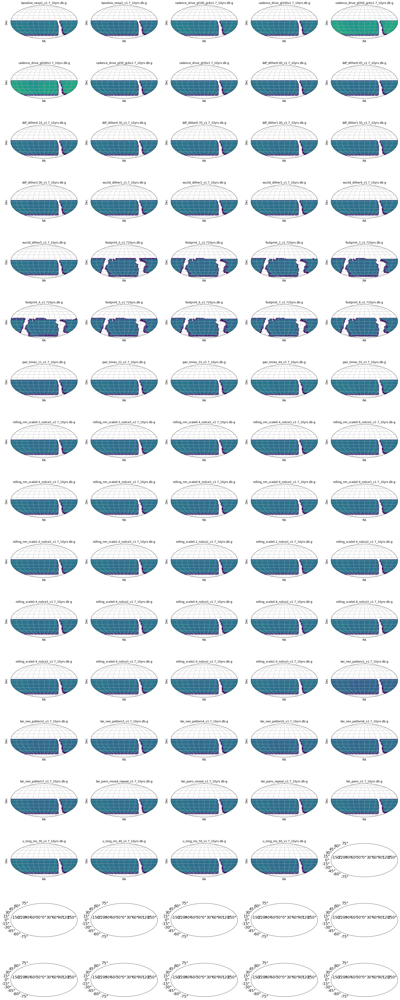

In [11]:
dblist_all = dblist_all
df_dic = df_dic_v1_7
# groupby healpix
bydic = {
        "observationStartMJD": "count",
        "fieldRA" : "mean",
        "fieldDec": "mean",
        "fieldGl" : "min",
        "fieldGb": "min",
    }
f = 'g'
coord = 'C'

fig, axs = plt.subplots(17, 5, figsize=(30, 80),
                            subplot_kw={'projection': 'mollweide'}); 
axs = axs.flatten()

for i, dbname in enumerate( dblist_all ):  
    df_opsim = df_dic[dbname]

    #slicer = df_opsim['note'].str.contains("DD")
    slicer = df_opsim['proposalId'] == 1
    df = df_opsim[slicer]

    df = df.groupby(by=['pixId','filter'], as_index=False).agg(bydic).rename(columns={"observationStartMJD": "Nv"})
    
    df_f = df[ df['filter']==f ]
    if coord=='G':
        x = df_f['fieldGl'].values
        y = df_f['fieldGb'].values       
    else:
        x = df_f['fieldRA'].values
        y = df_f['fieldDec'].values
    c = df_f['Nv'].values
    if len(c)!=0:
        plot_mwd(axs[i], x, y, c, title=f, colorbar=False, vmax=300,)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].set_title(dbname + '-' + f)



/home/idies/lsst/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/matplotlib/projections/geo.py:421: RuntimeWarning: invalid value encountered in arcsin
  theta = np.arcsin(y / np.sqrt(2))


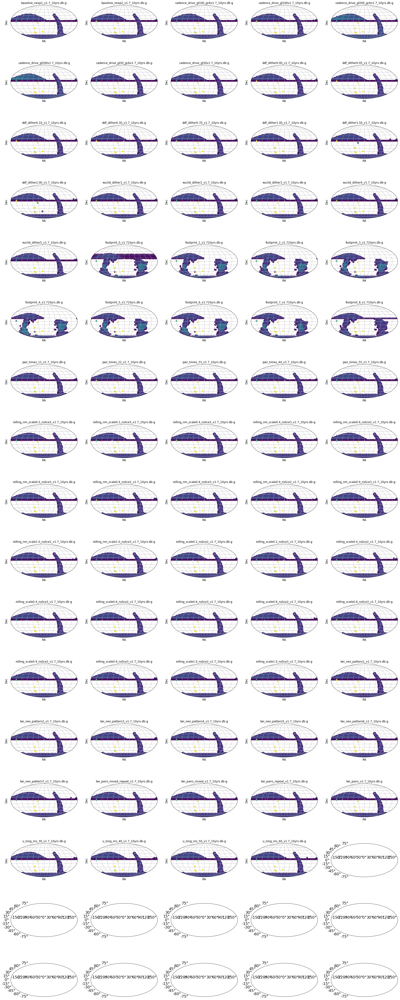

In [12]:

dblist_all = dblist_all
df_dic = df_dic_v1_7
# groupby healpix
bydic = {
        "observationStartMJD": "count",
        "fieldRA" : "mean",
        "fieldDec": "mean",
        "fieldGl" : "min",
        "fieldGb": "min",
    }
f = 'g'
coord = 'C'

fig, axs = plt.subplots(17, 5, figsize=(30, 80),
                            subplot_kw={'projection': 'mollweide'}); 
axs = axs.flatten()

for i, dbname in enumerate( dblist_all ):  
    df_opsim = df_dic[dbname]
    
    slicer = df_opsim['proposalId'] != 1

    df = df_opsim[slicer]

    df = df.groupby(by=['pixId','filter'], as_index=False).agg(bydic).rename(columns={"observationStartMJD": "Nv"})
    
    df_f = df[ df['filter']==f ]
    if coord=='G':
        x = df_f['fieldGl'].values
        y = df_f['fieldGb'].values       
    else:
        x = df_f['fieldRA'].values
        y = df_f['fieldDec'].values
    c = df_f['Nv'].values
    if len(c)!=0:
        plot_mwd(axs[i], x, y, c, title=f, colorbar=False, vmax=300,)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].set_title(dbname + '-' + f)



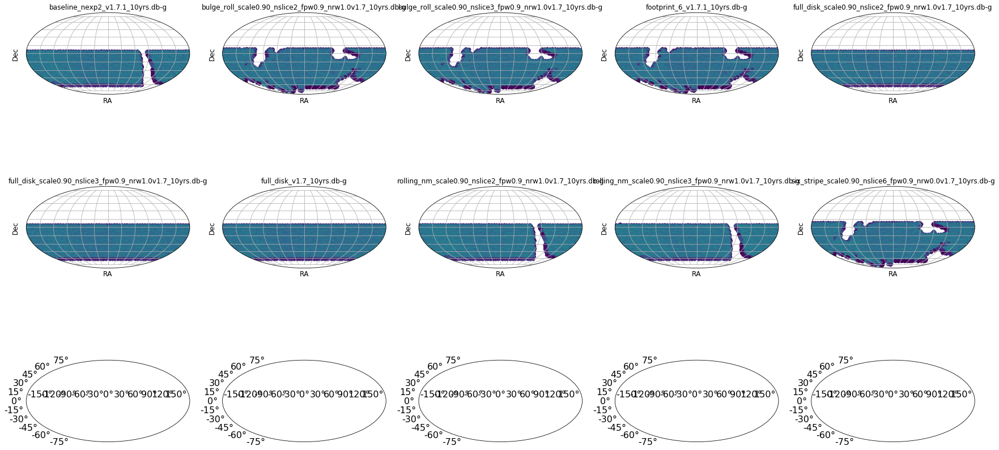

In [17]:
dblist_all = dblist_all_v1_7_1
df_dic = df_dic_v1_7_1
# groupby healpix
bydic = {
        "observationStartMJD": "count",
        "fieldRA" : "mean",
        "fieldDec": "mean",
        "fieldGl" : "min",
        "fieldGb": "min",
    }
f = 'g'
coord = 'C'

fig, axs = plt.subplots(3, 5, figsize=(30, 80/5),
                            subplot_kw={'projection': 'mollweide'}); 
axs = axs.flatten()

for i, dbname in enumerate( dblist_all ):  
    df_opsim = df_dic[dbname]

    #slicer = df_opsim['note'].str.contains("DD")
    slicer = df_opsim['proposalId'] == 1
    df = df_opsim[slicer]

    df = df.groupby(by=['pixId','filter'], as_index=False).agg(bydic).rename(columns={"observationStartMJD": "Nv"})
    
    df_f = df[ df['filter']==f ]
    if coord=='G':
        x = df_f['fieldGl'].values
        y = df_f['fieldGb'].values       
    else:
        x = df_f['fieldRA'].values
        y = df_f['fieldDec'].values
    c = df_f['Nv'].values
    if len(c)!=0:
        plot_mwd(axs[i], x, y, c, title=f, colorbar=False, vmax=300,)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].set_title(dbname + '-' + f)




In [ ]:
dblist_all = dblist_all
df_dic = df_dic_v1_7
# groupby healpix
bydic = {
        "observationStartMJD": "count",
        "fieldRA" : "mean",
        "fieldDec": "mean",
        "fieldGl" : "min",
        "fieldGb": "min",
    }
f = 'g'
coord = 'C'

fig, axs = plt.subplots(17, 5, figsize=(30, 80),
                            subplot_kw={'projection': 'mollweide'}); 
axs = axs.flatten()

for i, dbname in enumerate( dblist_all ):  
    df_opsim = df_dic[dbname]

    #slicer = df_opsim['note'].str.contains("DD")
    slicer = df_opsim['proposalId'] == 1
    df = df_opsim[slicer]

    df = df.groupby(by=['pixId','filter'], as_index=False).agg(bydic).rename(columns={"observationStartMJD": "Nv"})
    
    df_f = df[ df['filter']==f ]
    if coord=='G':
        x = df_f['fieldGl'].values
        y = df_f['fieldGb'].values       
    else:
        x = df_f['fieldRA'].values
        y = df_f['fieldDec'].values
    c = df_f['Nv'].values
    if len(c)!=0:
        plot_mwd(axs[i], x, y, c, title=f, colorbar=False, vmax=300,)
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].set_title(dbname + '-' + f)



